
# Assignment 3

Assignment 3, Parsa Alamzadeh -- palamzad@sfu.ca, 301316272

## Install dependencies and initialization

In [ ]:
# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1 -q
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html -q
!pip install torchsummary

In [ ]:
!pwd # shows current directory
!ls  # shows all files in this directory
!nvidia-smi # shows the specs and the current status of the allocated GPU

/content
'=2.0.1'   drive   sample_data
Fri Oct 30 05:26:18 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.32.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P0    36W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                

In [ ]:
# import some common libraries
from google.colab.patches import cv2_imshow
from sklearn.metrics import jaccard_score
from PIL import Image, ImageDraw
from torchsummary import summary
from tqdm.notebook import tqdm
from glob import glob
import pandas as pd
import numpy as np
import datetime
import random
import json
import cv2
import csv
import os
import re
# import some common pytorch utilities
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torch.autograd import Variable
import torch.nn.functional as F
import torch.nn as nn
import torch

# import some common detectron2 utilities
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.structures import BoxMode
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.utils.logger import setup_logger
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import Visualizer
from detectron2.data import build_detection_test_loader
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
setup_logger()

<Logger detectron2 (DEBUG)>

In [ ]:
# Make sure that GPU is available for your notebook. 
# Otherwise, you need to update the settungs in Runtime -> Change runtime type -> Hardware accelerator
torch.cuda.is_available()

True

In [ ]:
# You need to mount your google drive in order to load the data:
from google.colab import drive
drive.flush_and_unmount()
drive.mount('/content/drive')
# Put all the corresponding data files in a data folder and put the data folder in a same directory with this notebook.
# Also create an output directory for your files such as the trained models and the output images.

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive


In [ ]:
# Define the location of current directory, which should contain data/train, data/test, and data/train.json.
# TODO: approx 1 line
BASE_DIR = '/content/drive/My Drive/CMPT_CV_lab3'
OUTPUT_DIR = '{}/output'.format(BASE_DIR)
os.makedirs(OUTPUT_DIR, exist_ok=True)

## Part 1: Object Detection

### Data Loader

In [ ]:
'''
# This function should return a list of data samples in which each sample is a dictionary. 
# Make sure to select the correct bbox_mode for the data
# For the test data, you only have access to the images, therefore, the annotations should be empty.
# Other values could be obtained from the image files.
# TODO: approx 35 lines
'''
def train(set_name, eval_size = 0):
  data_dirs = f'{BASE_DIR}/data/train.json'
  with open(data_dirs) as j:
      imgs_anns = json.load(j)
  dataset_dicts={}
  for idx, v in enumerate(tqdm(imgs_anns)):
      filename = os.path.join(f'{BASE_DIR}/data/train', v["file_name"])
      annotations = v["segmentation"]
      px = [annotations[0][i] for i in range(0, len(annotations[0]), 2)]
      py = [annotations[0][i] for i in range(1, len(annotations[0]), 2)]
      poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
      poly = [p for x in poly for p in x]
      obj = {
          "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
          "bbox_mode": BoxMode.XYXY_ABS,
          "segmentation": [poly],
          "category_id": 0,
      }
      if not filename in dataset_dicts:
          dataset_dicts[filename] = {}
          dataset_dicts[filename]['annotations'] = []
          width, height = Image.open(filename).size
          dataset_dicts[filename]['file_name'] = filename
          dataset_dicts[filename]['image_id'] = idx
          dataset_dicts[filename]['height'] = int(height)
          dataset_dicts[filename]['width'] = int(width)
      dataset_dicts[filename]['annotations'].append(obj)
  dataset_dicts = np.array(list(dataset_dicts.values()))
  vals = np.random.choice(dataset_dicts.shape[0], eval_size) # Select 35 random samples from the 198 training samples for evaluation
  return dataset_dicts, vals # remove the evaluation samples

dataset_dic, vals = train('train.json', 0)



def get_detection_data(set_name):
  if set_name == 'validation.json':
    return dataset_dic[vals].tolist()

  if set_name == 'test.json':
      dataset_dicts = []
      for f in tqdm(glob(f'{BASE_DIR}/data/test/*')):
          entry = {}
          width, height = Image.open(f).size
          entry['file_name'] = f
          entry['height'] = int(height)
          entry['width'] = int(width)
          entry['annotations'] = []
          dataset_dicts.append(entry)
      return dataset_dicts
  else:
    train_dataset = np.delete(dataset_dic, vals)
    return train_dataset.tolist()





In [ ]:
# DatasetCatalog.remove('plane_train')
# DatasetCatalog.remove('plane_test')
# DatasetCatalog.remove('plane_validation')

In [ ]:
'''
# Remember to add your dataset to DatasetCatalog and MetadataCatalog
# Consdier "data_detection_train" and "data_detection_test" for registration
# You can also add an optional "data_detection_val" for your validation by spliting the training data
# TODO: approx 5 lines
'''
for d in ["train","test",'validation']:
    DatasetCatalog.register("plane_" + d, lambda d=d: get_detection_data(d+'.json'))
    MetadataCatalog.get("plane_" + d).set(thing_classes=["planes"])
planes_metadata = MetadataCatalog.get("plane_train")


### Visualization

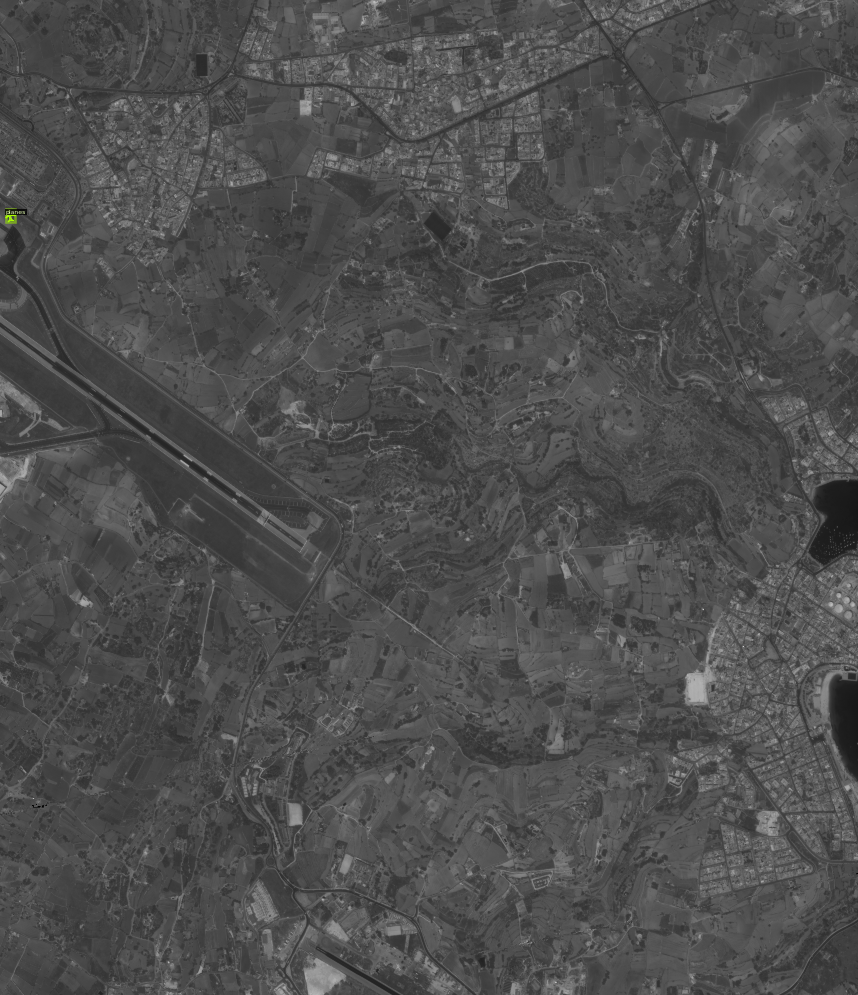

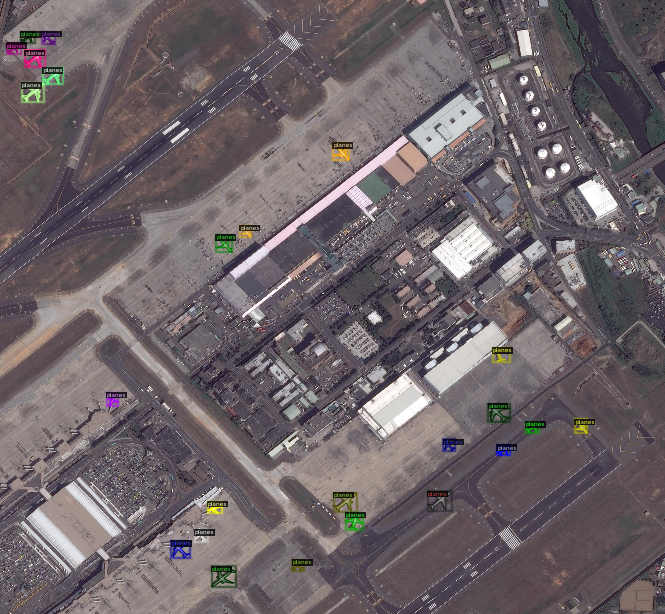

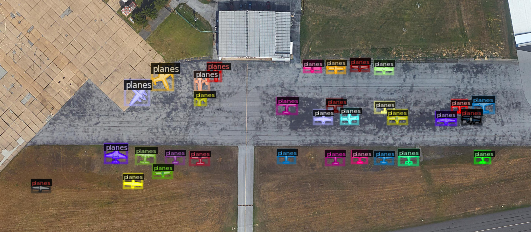

In [ ]:
'''
# Visualize some samples using Visualizer to make sure that the function works correctly
# TODO: approx 5 lines
'''


dataset_dicts = get_detection_data("train.json")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=planes_metadata, scale=0.2)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])


### Set Configs

In [75]:
'''
# Set the configs for the detection part in here.
# TODO: approx 15 lines
'''
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("plane_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 5000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 768   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
cfg.OUTPUT_DIR = f"{BASE_DIR}/output/"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)




### Training

In [76]:
'''
# Create a DefaultTrainer using the above config and train the model
# TODO: approx 5 lines
'''
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
# trainer.train()



[11/02 05:23:21 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

### Evaluation and Visualization

In [ ]:
%load_ext tensorboard
%tensorboard --logdir drive/My\ Drive/CMPT_CV_lab3/output

### Loading the model

In [77]:
'''
# After training the model, you need to update cfg.MODEL.WEIGHTS
# Define a DefaultPredictor
'''

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6   # set a custom testing threshold
predictor = DefaultPredictor(cfg)


### Visualization

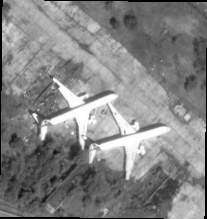

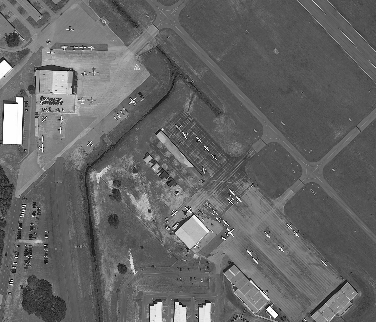

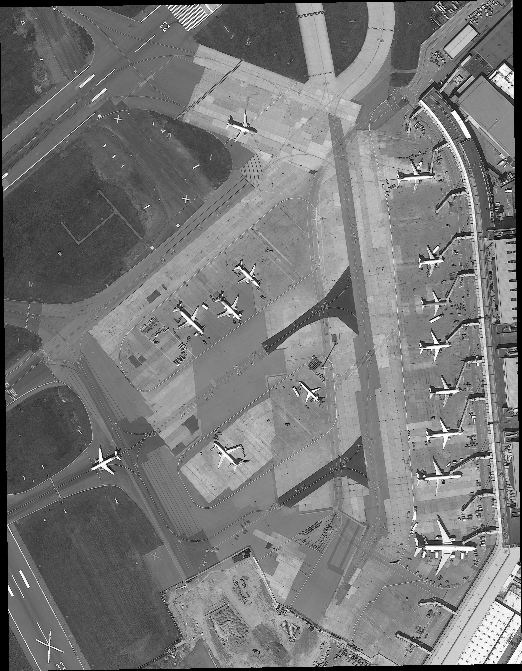

In [ ]:
'''
# Visualize the output for 3 random test samples
# TODO: approx 10 lines
'''
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_detection_data("test.json")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=planes_metadata, 
                   scale=0.2, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])


### Evaluation

In [ ]:
'''
# Use COCOEvaluator and build_detection_train_loader
# You can save the output predictions using inference_on_dataset
# TODO: approx 5 lines
'''
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("plane_validation", cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "plane_validation")
print(inference_on_dataset(trainer.model, val_loader, evaluator))


[11/01 08:16:58 d2.data.common]: Serializing 10 elements to byte tensors and concatenating them all ...
[11/01 08:16:58 d2.data.common]: Serialized dataset takes 2.44 MiB
[11/01 08:16:58 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/01 08:16:58 d2.evaluation.evaluator]: Start inference on 10 images
[11/01 08:18:20 d2.evaluation.evaluator]: Total inference time: 0:00:14.226568 (2.845314 s / img per device, on 1 devices)
[11/01 08:18:20 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.141312 s / img per device, on 1 devices)
[11/01 08:18:20 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[11/01 08:18:20 d2.evaluation.coco_evaluation]: Saving results to /content/drive/My Drive/CMPT_CV_lab3/output/coco_instances_results.json
[11/01 08:18:20 d2.evaluation.coco_evaluation]: Evaluating predictions ...
Loading and preparing results...
DONE (t=0.00

### Improvements

For this part, you can bring any improvement which you have by adding new input parameters to the previous functions or defining new functions and variables.

In [ ]:
'''
# Bring any changes and updates regarding the improvement in here
'''


## Part 2: Semantic Segmentation

### Data Loader

In [55]:
'''
# Write a function that returns the cropped image and corresponding mask regarding the target bounding box
# idx is the index of the target bbox in the data
# high-resolution image could be passed or could be load from data['file_name']
# You can use detectron2.utils.visualizer.GenericMask to convert the segmentation annotations to binary masks
# TODO: approx 10 lines
'''

def get_instance_sample(data, img=None):
  filename = data['file_name']
  img = cv2.imread(filename)
  dic = {'img': [], 'mask':[]}
  for idx in range(len(data['annotations'])):
      annos = data['annotations'][idx]
      bbox = annos['bbox']
      sx,sy,ex,ey = [int(i) for i in bbox]
      obj_img = img[sy:ey, sx:ex]
      segs = annos['segmentation'][0]
      obj_mask = detectron2.utils.visualizer.GenericMask(data["annotations"][idx]["segmentation"], data['height'], data['width']).mask
      obj_mask = obj_mask[sy:ey, sx:ex]*255
      obj_img = cv2.resize(obj_img, (128, 128), interpolation = cv2.INTER_AREA) 
      obj_mask = cv2.resize(obj_mask, (128, 128), interpolation = cv2.INTER_AREA)
      dic['img'].append(obj_img)
      dic['mask'].append(obj_mask)
  return dic
# obj_mask, obj_img = get_instance_sample(get_detection_data('train.json')[1],5)
# cv2_imshow(obj_mask)
# cv2_imshow(obj_img)
# obj_img.shape, obj_mask.shape


In [56]:
m = get_detection_data('train.json')
data = {'img':[], 'masks':[]}
for i in tqdm(m):
    fname = i["file_name"].split('/')[-1].split('.')[0]
    dic = get_instance_sample(i)
    data['img']+=[dic['img']]
    data['masks']+=[dic['mask']]


In [57]:
'''
# We have provided a template data loader for your segmentation training
# You need to complete the __getitem__() function before running the code
# You may also need to add data augmentation or normalization in here
'''

class PlaneDataset(Dataset):
  def __init__(self, set_name, data_list):
      self.transforms = transforms.Compose([
          transforms.ToTensor(), # Converting the image to tensor and change the image format (Channels-Last => Channels-First)
      ])
      self.set_name = set_name
      self.data = data_list
      self.instance_map = []
      for i, d in enumerate(self.data):
        for j in range(len(d['annotations'])):
          self.instance_map.append([i,j])


  '''
  # you can change the value of length to a small number like 10 for debugging of your training procedure and overfeating
  # make sure to use the correct length for the final training
  '''
  def __len__(self):
      return len(self.instance_map)

  def numpy_to_tensor(self, img, mask):
    if self.transforms is not None:
        img = self.transforms(img)
        mask = self.transforms(mask)
    img = torch.as_tensor(img, dtype=torch.float)
    mask = torch.as_tensor(mask, dtype=torch.float)
    return img, mask

  '''
  # Complete this part by using get_instance_sample function
  # make sure to resize the img and mask to a fixed size (for example 128*128)
  # you can use "interpolate" function of pytorch or "numpy.resize"
  # TODO: 5 lines
  '''
  def __getitem__(self, idx):
    if torch.is_tensor(idx):
        idx = idx.tolist()
    idx = self.instance_map[idx]
    obj_mask = data['masks'][idx[0]][idx[1]]
    obj_img = data['img'][idx[0]][idx[1]]
    img, mask = self.numpy_to_tensor(obj_img, obj_mask)    
    return img, mask

def get_plane_dataset(set_name='train', batch_size=2):
    my_data_list = DatasetCatalog.get("plane_{}".format(set_name))
    dataset = PlaneDataset(set_name, my_data_list)
    loader = DataLoader(dataset, batch_size=batch_size, num_workers=4,
                                              pin_memory=True, shuffle=True)
    return loader, dataset

### Network

In [58]:
'''
# convolution module as a template layer consists of conv2d layer, batch normalization, and relu activation
'''
class conv(nn.Module):
    def __init__(self, in_ch, out_ch, activation=True):
        super(conv, self).__init__()
        if(activation):
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1),
             nn.BatchNorm2d(out_ch),
             nn.ReLU(inplace=True)
          )
        else:
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1)  ,
             )

    def forward(self, x):
        x = self.layer(x)
        return x


'''
# downsampling module equal to a conv module followed by a max-pool layer
'''
class down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(down, self).__init__()
        self.layer = nn.Sequential(
            conv(in_ch, out_ch),
            nn.MaxPool2d(2)
            )

    def forward(self, x):
        x = self.layer(x)
        return x

'''
# upsampling module equal to a upsample function followed by a conv module
'''
class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=False):
        super(up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch, in_ch, 2, stride=2)

        self.conv = conv(in_ch, out_ch)

    def forward(self, x):
        y = self.up(x)
        y = self.conv(y)
        return y

'''
# the main model which you need to complete by using above modules.
# you can also modify the above modules in order to improve your results.
'''
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        
        # Encoder
        
        self.input_conv = conv(3, 8)
        self.down_1 = down(8, 16)
        self.down_2 = down(16, 32)
        self.down_3 = down(32, 64)
        self.down_4 = down(64, 128)
        self.down_5 = down(128, 256)
        self.down_6 = down(256, 512)
        
        # Decoder
        
        self.up_1 = up(512, 256)
        self.up_2 = up(256, 128)
        self.up_3 = up(128, 64)
        self.up_4 = up(64, 32)
        self.up_5 = up(32, 16)
        self.up_6 = up(16, 8)
        self.up_7 = conv(8, 3)
        self.output_conv = conv(3, 1, False) # ReLu activation is removed to keep the logits for the loss function
        
        self.normal_1 = nn.BatchNorm2d(8)
        self.normal_2 = nn.BatchNorm2d(16)
        self.normal_3 = nn.BatchNorm2d(32)
        self.normal_4 = nn.BatchNorm2d(64)
        self.normal_5 = nn.BatchNorm2d(128)
        self.normal_6 = nn.BatchNorm2d(256)

    def forward(self, input):
      y_1 = self.input_conv(input)
      y_2 = self.down_1(y_1)
      y_3 = self.down_2(y_2)
      y_4 = self.down_3(y_3)
      y_5 = self.down_4(y_4)
      y_6 = self.down_5(y_5)
      y_7 = self.down_6(y_6)
      y_7 = self.normal_6(F.relu(self.up_1(y_7) + y_6))
      y_6 = self.normal_5(F.relu(self.up_2(y_7) + y_5))
      y_5 = self.normal_4(F.relu(self.up_3(y_6) + y_4))
      y_4 = self.normal_3(F.relu(self.up_4(y_5) + y_3))
      y_3 = self.normal_2(F.relu(self.up_5(y_4) + y_2))
      y_2 = self.normal_1(F.relu(self.up_6(y_3) + y_1))
      y = self.up_7(y_2)
      output = self.output_conv(y)
      return output

In [ ]:
model = MyModel().cuda()
summary(model, (3,128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 128, 128]             224
       BatchNorm2d-2          [-1, 8, 128, 128]              16
              ReLU-3          [-1, 8, 128, 128]               0
              conv-4          [-1, 8, 128, 128]               0
            Conv2d-5         [-1, 16, 128, 128]           1,168
       BatchNorm2d-6         [-1, 16, 128, 128]              32
              ReLU-7         [-1, 16, 128, 128]               0
              conv-8         [-1, 16, 128, 128]               0
         MaxPool2d-9           [-1, 16, 64, 64]               0
             down-10           [-1, 16, 64, 64]               0
           Conv2d-11           [-1, 32, 64, 64]           4,640
      BatchNorm2d-12           [-1, 32, 64, 64]              64
             ReLU-13           [-1, 32, 64, 64]               0
             conv-14           [-1, 32,

### Training

In [67]:
'''
# The following is a basic training procedure to train the network
# You need to update the code to get the best performance
# TODO: approx ? lines
'''

# Set the hyperparameters
num_epochs = 50
batch_size = 32
learning_rate = 1e-1
weight_decay = 1e-5

model = MyModel() # initialize the model
model = model.cuda() # move the model to GPU
loader, _ = get_plane_dataset('train', batch_size) # initialize data_loader
crit = nn.BCEWithLogitsLoss() # Define the loss function
optim = torch.optim.SGD(model.parameters(), lr=learning_rate, weight_decay=weight_decay) # Initialize the optimizer as SGD
i=1
# start the training procedure
for epoch in tqdm(range(num_epochs)):
  total_loss = 0
  if i % 15 == 0 and i > 16:
    for param_group in optim.param_groups:
      param_group['lr'] /=10
  for (img, mask) in tqdm(loader):
    img = torch.tensor(img, device=torch.device('cuda'), requires_grad = True)
    mask = torch.tensor(mask, device=torch.device('cuda'), requires_grad = True)
    pred = model(img)
    loss = crit(pred, mask)
    optim.zero_grad()
    loss.backward()
    optim.step()
    total_loss += loss.cpu().data
  print("Epoch: {}, Loss: {}".format(epoch, total_loss/len(loader)))
  i+=1

'''
# Saving the final model
'''
torch.save(model.state_dict(), '{}/output/final_segmentation_model.pth'.format(BASE_DIR))


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



Epoch: 0, Loss: 0.2938464283943176



Epoch: 1, Loss: 0.20570197701454163



Epoch: 2, Loss: 0.18708081543445587



Epoch: 3, Loss: 0.17660804092884064



Epoch: 4, Loss: 0.16765902936458588



Epoch: 5, Loss: 0.16119533777236938



Epoch: 6, Loss: 0.15368597209453583



Epoch: 7, Loss: 0.14821414649486542



Epoch: 8, Loss: 0.1431024819612503



Epoch: 9, Loss: 0.13832460343837738



Epoch: 10, Loss: 0.13410453498363495



Epoch: 11, Loss: 0.1297948956489563



Epoch: 12, Loss: 0.1264888495206833



Epoch: 13, Loss: 0.12207098305225372



Epoch: 14, Loss: 0.11959543079137802



Epoch: 15, Loss: 0.11568258702754974



Epoch: 16, Loss: 0.11312294006347656



Epoch: 17, Loss: 0.11067895591259003



Epoch: 18, Loss: 0.10780101269483566



Epoch: 19, Loss: 0.10750684887170792



Epoch: 20, Loss: 0.10347440838813782



Epoch: 21, Loss: 0.10091053694486618



Epoch: 22, Loss: 0.09881140291690826



Epoch: 23, Loss: 0.09779982268810272



Epoch: 24, Loss: 0.09646252542734146



Epoch: 25, Loss: 0.09378017485141754



Epoch: 26, Loss: 0.0923384428024292



Epoch: 27, Loss: 0.09027284383773804



Epoch: 28, Loss: 0.08985818922519684



Epoch: 29, Loss: 0.08181484043598175



Epoch: 30, Loss: 0.07862301915884018



Epoch: 31, Loss: 0.07776571810245514



Epoch: 32, Loss: 0.07689595967531204



Epoch: 33, Loss: 0.07634272426366806



Epoch: 34, Loss: 0.07577761262655258



Epoch: 35, Loss: 0.07528248429298401



Epoch: 36, Loss: 0.07512043416500092



Epoch: 37, Loss: 0.07454942166805267



Epoch: 38, Loss: 0.0746563971042633



Epoch: 39, Loss: 0.07383351027965546



Epoch: 40, Loss: 0.07372164726257324



Epoch: 41, Loss: 0.07351769506931305



Epoch: 42, Loss: 0.07310175150632858



Epoch: 43, Loss: 0.07272499054670334



Epoch: 44, Loss: 0.0722842812538147



Epoch: 45, Loss: 0.07228731364011765



Epoch: 46, Loss: 0.07221958786249161



Epoch: 47, Loss: 0.07229963690042496



Epoch: 48, Loss: 0.07212993502616882



Epoch: 49, Loss: 0.07215402275323868



### Evaluation and Visualization

In [72]:
'''
# Before starting the evaluation, you need to set the model mode to eval
# You may load the trained model again, in case if you want to continue your code later
# TODO: approx 15 lines
'''
batch_size = 1
model = MyModel().cuda()
model.load_state_dict(torch.load('{}/output/final_segmentation_model.pth'.format(BASE_DIR)))
model = model.eval() # chaning the model to evaluation mode will fix the bachnorm layers
loader, dataset = get_plane_dataset('train', batch_size)

def sigmoid(x):
  return 1/(1 + np.exp(-x))

def iou_coef(y_true, y_pred):
  y_true = np.rint(sigmoid(y_true))
  y_pred = np.rint(sigmoid(y_pred))
  intersection = np.count_nonzero(np.multiply(y_true, y_pred))
  union = np.count_nonzero(y_true+y_pred)
  if union == 0:
      return 0
  return intersection/union


total_iou = 0
count = 0
for (img, mask) in tqdm(loader):
  with torch.no_grad():
    img = img.cuda()
    mask = mask.cpu().detach()
    pred = model(img).cpu().detach()
    for i in range(img.shape[0]):
        # newimg = transforms.ToPILImage()(img[i].cpu())
        predicted = np.array(pred[i])[0]
        # cv2_imshow(np.array(newimg))
        masked = np.array(mask[i])[0]
        # cv2_imshow(predicted)
        # cv2_imshow(masked*255)
        count+=1
        total_iou+=iou_coef(masked, predicted)
  '''
  ## Complete the code by obtaining the IoU for each img and print the final Mean IoU
  '''
    

print("\n #images: {}, Mean IoU: {}".format(count, total_iou/count))




 #images: 7980, Mean IoU: 0.9027068642029763


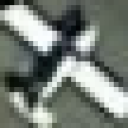

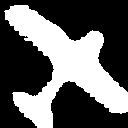

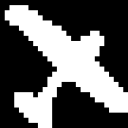

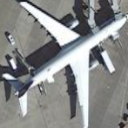

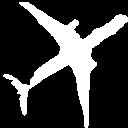

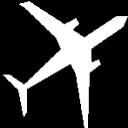

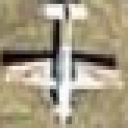

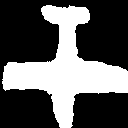

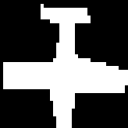

In [73]:
  '''
# Visualize 3 sample outputs
# TODO: approx 5 lines
'''
batch_size = 3
loader, dataset = get_plane_dataset('train', batch_size)

img, mask = next(iter(loader))
with torch.no_grad():
    img = img.cuda()
    mask = mask.cpu().detach()
    pred = model(img).cpu().detach()
    for i in range(img.shape[0]):
        newimg = transforms.ToPILImage()(img[i].cpu())
        cv2_imshow(np.array(newimg))
        predicted = np.rint(sigmoid(np.array(pred[i])[0]))*255
        masked = np.array(mask[i])[0]*255
        cv2_imshow(predicted)
        cv2_imshow(masked)

## Part 3: Instance Segmentation

In this part, you need to obtain the instance segmentation results for the test data by using the trained segmentation model in the previous part and the detection model in Part 1.

### Get Prediction

In [ ]:
dataset_dic[0]['annotations'][0]['bbox']

[1369, 4510, 1485, 4625]

In [ ]:
model = MyModel().cuda()
model.load_state_dict(torch.load('{}/output/final_segmentation_model.pth'.format(BASE_DIR)))

<All keys matched successfully>

In [64]:
'''
# Define a new function to obtain the prediction mask by passing a sample data
# For this part, you need to use all the previous parts (predictor, get_instance_sample, data preprocessings, etc)
# TODO: approx 35 lines
'''
def sigmoid(x):
  return 1/(1 + np.exp(-x))


def get_prediction_mask(my_data, train=False):
  img = cv2.imread(my_data['file_name'])
  if train:
      pred_masks = np.zeros([my_data['height'], my_data['width']])
      imgs = []

      for i,j in enumerate(my_data['annotations']):
          bbox = j['bbox']
          y1, x1, y2, x2 = bbox
          to_be_masked = img[x1:x2, y1:y2]
          to_be_masked = cv2.resize(to_be_masked, (128, 128), interpolation = cv2.INTER_AREA) # Resizing to make sure it matches our expected 
          prediction_from_mask = model(torch.unsqueeze(torch.tensor(transforms.ToTensor()(to_be_masked), device=torch.device('cuda')),0)).cpu().detach().numpy()[0] # Getting a mask prediction from my trained model
          prediction_from_mask = cv2.resize(prediction_from_mask[0], (y2-y1, x2-x1), interpolation = cv2.INTER_AREA) # Reshaping to the original shape
          prediction_from_mask = np.rint(sigmoid(prediction_from_mask))*(i+1)
          predicted_mask = pred_masks[x1:x2, y1:y2]
          predicted_mask[predicted_mask==0] = 10000
          overlapping = np.minimum(predicted_mask,prediction_from_mask)
          overlapping[overlapping == 1000] = 0
          pred_masks[x1:x2, y1:y2] = overlapping # set the masking of the location
  else:
      prediction_for_img = predictor(img)['instances'] # use the model from part 1 to get the bounding boxes
      pred_masks = np.zeros([my_data['height'], my_data['width']])
      imgs = []
      # Getting the bounding boxes from the pretrained model and 
      # Segmentation from the other model
      for i in range(len(prediction_for_img)):
          bbox = np.array(np.floor(list(prediction_for_img[i]._fields['pred_boxes'])[0].cpu().numpy()), dtype=np.uint32) # Getting the bounding boxes
          y1, x1, y2, x2 = bbox
          to_be_masked = img[x1:x2, y1:y2]
          to_be_masked = cv2.resize(to_be_masked, (128, 128), interpolation = cv2.INTER_AREA) # Resizing to make sure it matches our expected 
          prediction_from_mask = model(torch.unsqueeze(torch.tensor(transforms.ToTensor()(to_be_masked), device=torch.device('cuda')),0)).cpu().detach().numpy()[0] # Getting a mask prediction from my trained model
          prediction_from_mask = cv2.resize(prediction_from_mask[0], (y2-y1, x2-x1), interpolation = cv2.INTER_AREA) # Reshaping to the original shape
          prediction_from_mask = np.rint(sigmoid(prediction_from_mask))*(i+1)
          predicted_mask = pred_masks[x1:x2, y1:y2]
          predicted_mask[predicted_mask==0] = 10000
          overlapping = np.minimum(predicted_mask,prediction_from_mask)
          overlapping[overlapping == 1000] = 0
          pred_masks[x1:x2, y1:y2] = overlapping # set the masking of the location

  # Getting the true segementations from the data
  true_mask = np.zeros([my_data['height'], my_data['width']])
  for j,i in enumerate(my_data['annotations']):
      bbox = i['bbox']
      y1, x1, y2, x2 = [int(i) for i in bbox]
      x2 +=x1
      y2 += y1
      local_true_mask = detectron2.utils.visualizer.GenericMask(i['segmentation'], my_data['height'], my_data['width']).mask
      overlapping = np.maximum(true_mask[x1:x2, y1:y2],local_true_mask[x1:x2, y1:y2]*(j+1))
      true_mask[x1:x2, y1:y2] = overlapping
  return img, torch.tensor(true_mask, device=torch.device('cuda')), torch.tensor(pred_masks, device=torch.device('cuda'))

### Visualization and Submission

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


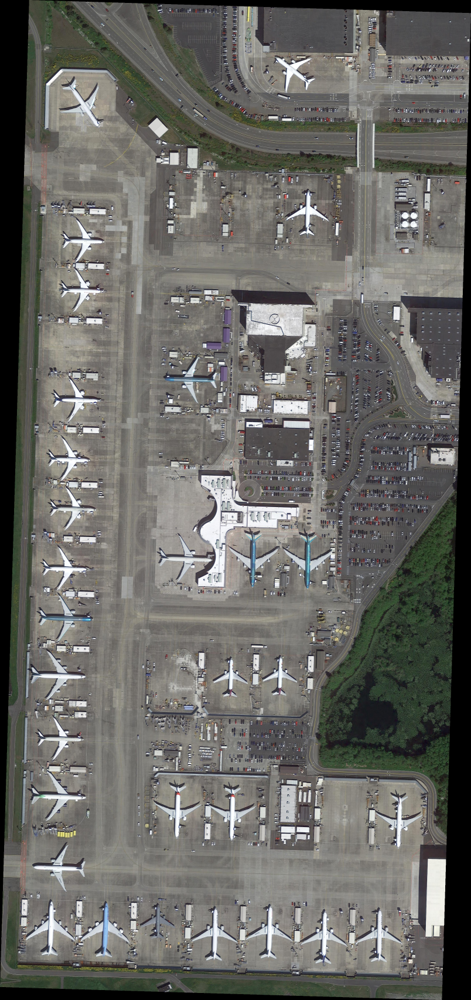

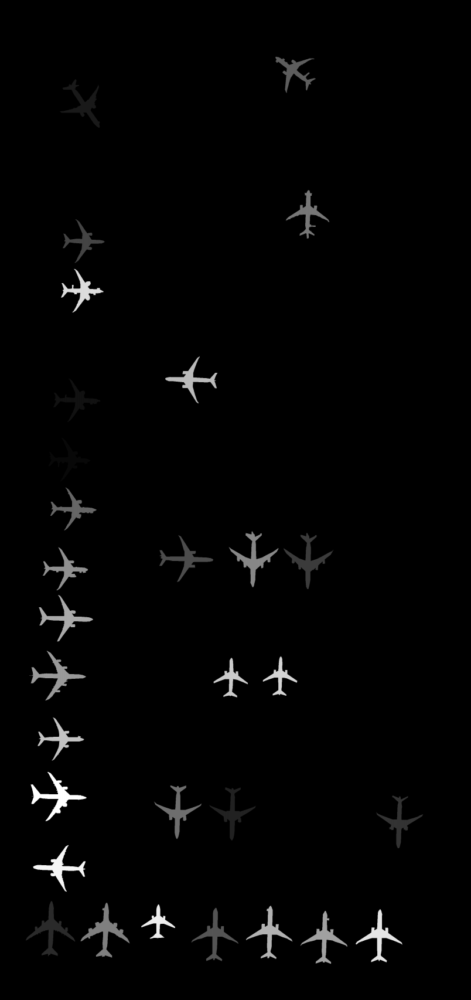

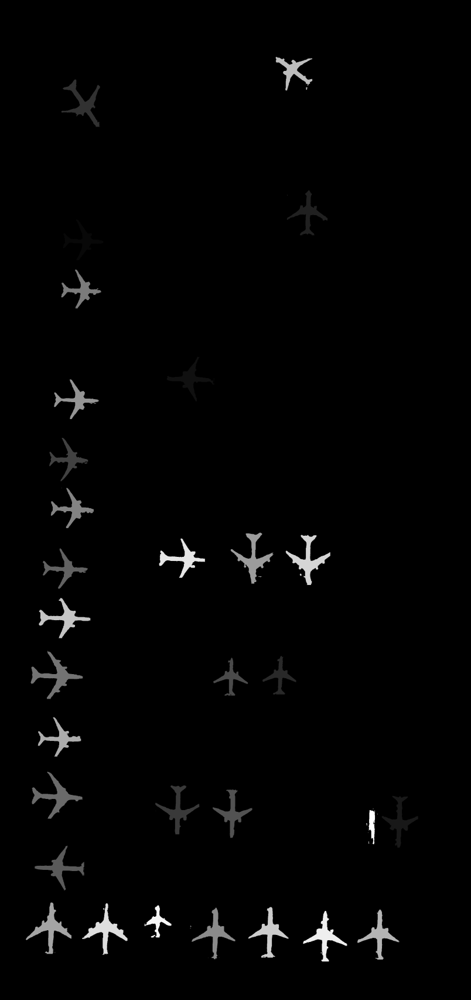

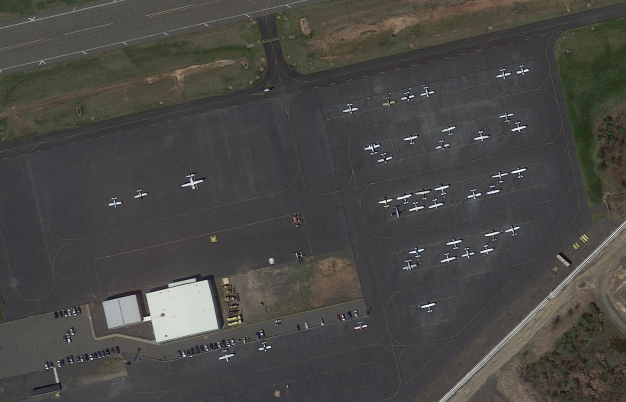

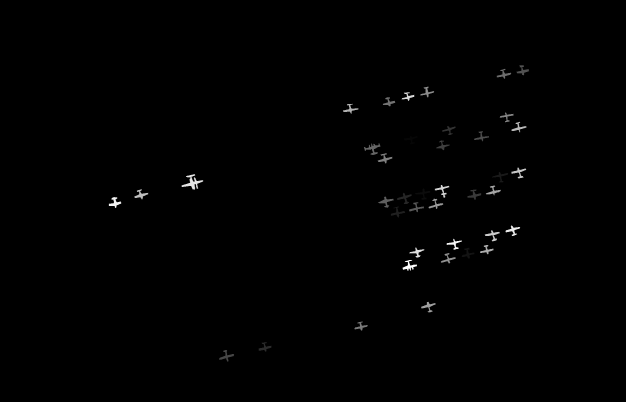

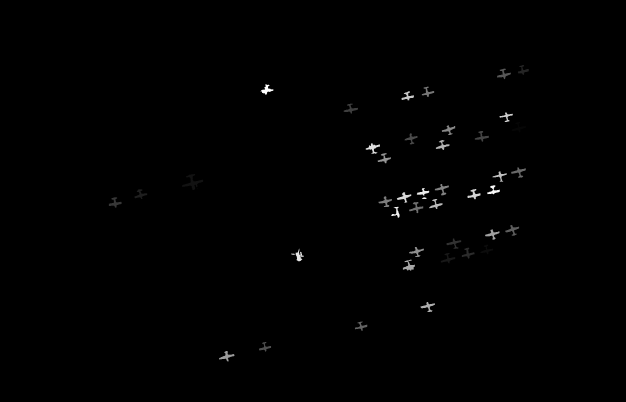

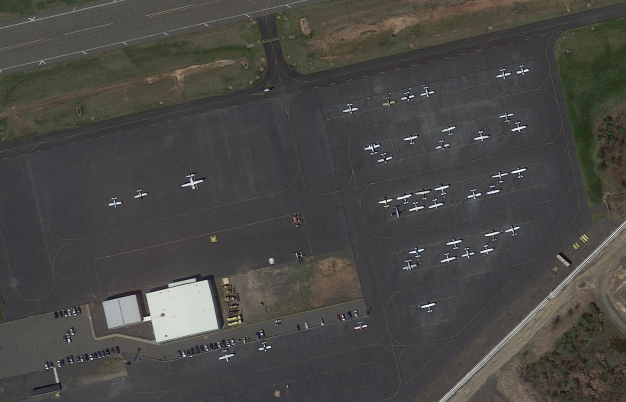

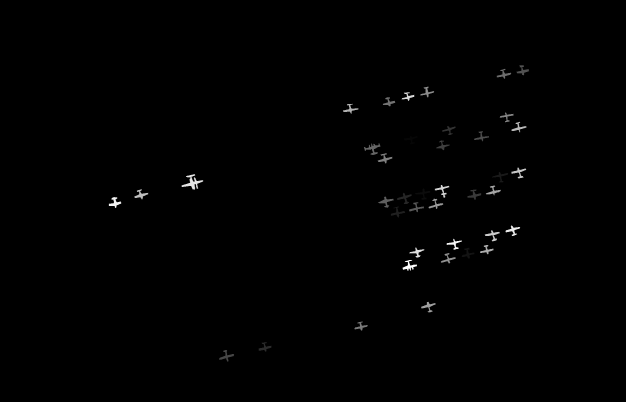

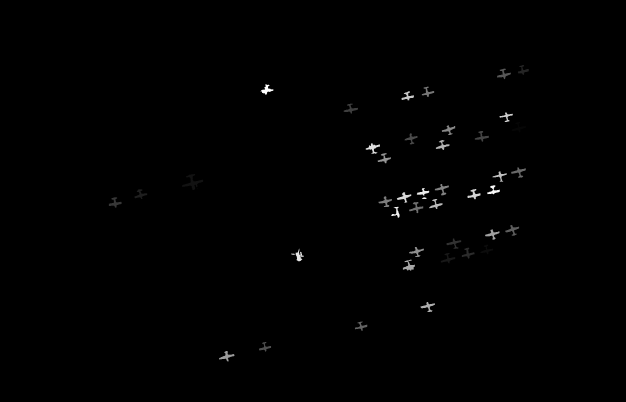

In [ ]:
'''
# Visualise the output prediction as well as the GT Mask and Input image for a sample input
# TODO: approx 10 lines
'''
dataset = get_detection_data('train.json')
for i in np.random.randint(0,50,3):
  img, true_mask, pred_mask = get_prediction_mask(dataset[i])
  pred_mask = pred_mask.cpu().numpy()
  true_mask = true_mask.cpu().numpy()
  max_val = pred_mask.max()
  fact = 255./max_val
  pred_mask*= fact
  max_val = true_mask.max()
  fact = 255./max_val
  true_mask*= fact
  cv2_imshow(cv2.resize(img, (img.shape[1]//3, img.shape[0]//3), interpolation = cv2.INTER_AREA))
  cv2_imshow(cv2.resize(true_mask, (true_mask.shape[1]//3, true_mask.shape[0]//3), interpolation = cv2.INTER_AREA))
  cv2_imshow(cv2.resize(pred_mask, (pred_mask.shape[1]//3, pred_mask.shape[0]//3), interpolation = cv2.INTER_AREA))




### Submission

In [65]:
'''
# ref: https://www.kaggle.com/rakhlin/fast-run-length-encoding-python
# https://www.kaggle.com/c/airbus-ship-detection/overview/evaluation
'''
def rle_encoding(x):
    '''
    x: pytorch tensor on gpu, 1 - mask, 0 - background
    Returns run length as list
    '''
    dots = torch.where(torch.flatten(x.long())==1)[0]
    if(len(dots)==0):
      return []
    inds = torch.where(dots[1:]!=dots[:-1]+1)[0]+1
    inds = torch.cat((torch.tensor([0], device=torch.device('cuda'), dtype=torch.long), inds))
    tmpdots = dots[inds]
    inds = torch.cat((inds, torch.tensor([len(dots)], device=torch.device('cuda'))))
    inds = inds[1:] - inds[:-1]
    runs = torch.cat((tmpdots, inds)).reshape((2,-1))
    runs = torch.flatten(torch.transpose(runs, 0, 1)).cpu().data.numpy()
    return ' '.join([str(i) for i in runs])

In [78]:
'''
# You need to upload the csv file on kaggle
# The speed of your code in the previous parts highly affects the running time of this part
'''

preddic = {"ImageId": [], "EncodedPixels": []}

'''
# Writing the predictions of the training set
'''
my_data_list = DatasetCatalog.get("plane_{}".format('train'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, _, pred_mask = get_prediction_mask(sample, True)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for index in inds:
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index)
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

'''
# Writing the predictions of the test set
'''

my_data_list = DatasetCatalog.get("plane_{}".format('test'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, true_mask, pred_mask = get_prediction_mask(sample)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for j, index in enumerate(inds):
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index).double()
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

pred_file = open("{}/pred.csv".format(BASE_DIR), 'w')
pd.DataFrame(preddic).to_csv(pred_file, index=False)
pred_file.close()


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


## Part 4: Mask R-CNN

For this part you need to follow a same procedure to part 2 with the configs of Mask R-CNN, other parts are generally the same as part 2.

## Dataloader

In [ ]:
dataset_dic, vals = train('train.json', 10) # for validation

# DatasetCatalog.remove('plane_train')
# DatasetCatalog.remove('plane_test')
# DatasetCatalog.remove('plane_validation')

for d in ["train","test",'validation']:
    DatasetCatalog.register("plane_" + d, lambda d=d: get_detection_data(d+'.json'))
    MetadataCatalog.get("plane_" + d).set(thing_classes=["planes"])
planes_metadata = MetadataCatalog.get("plane_train")


### Network

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("plane_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.002  # pick a good LR
cfg.SOLVER.MAX_ITER = 500    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
cfg.OUTPUT_DIR = f"{BASE_DIR}/output/"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)


### Training

In [ ]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
# trainer.train()
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)


[11/01 07:54:18 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

### Evaluation and Visualization

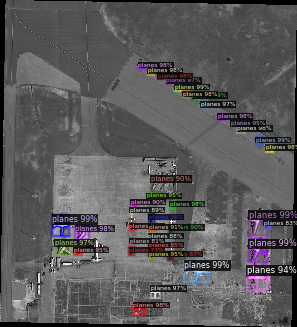

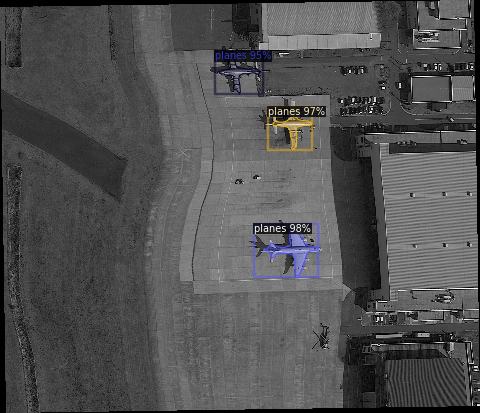

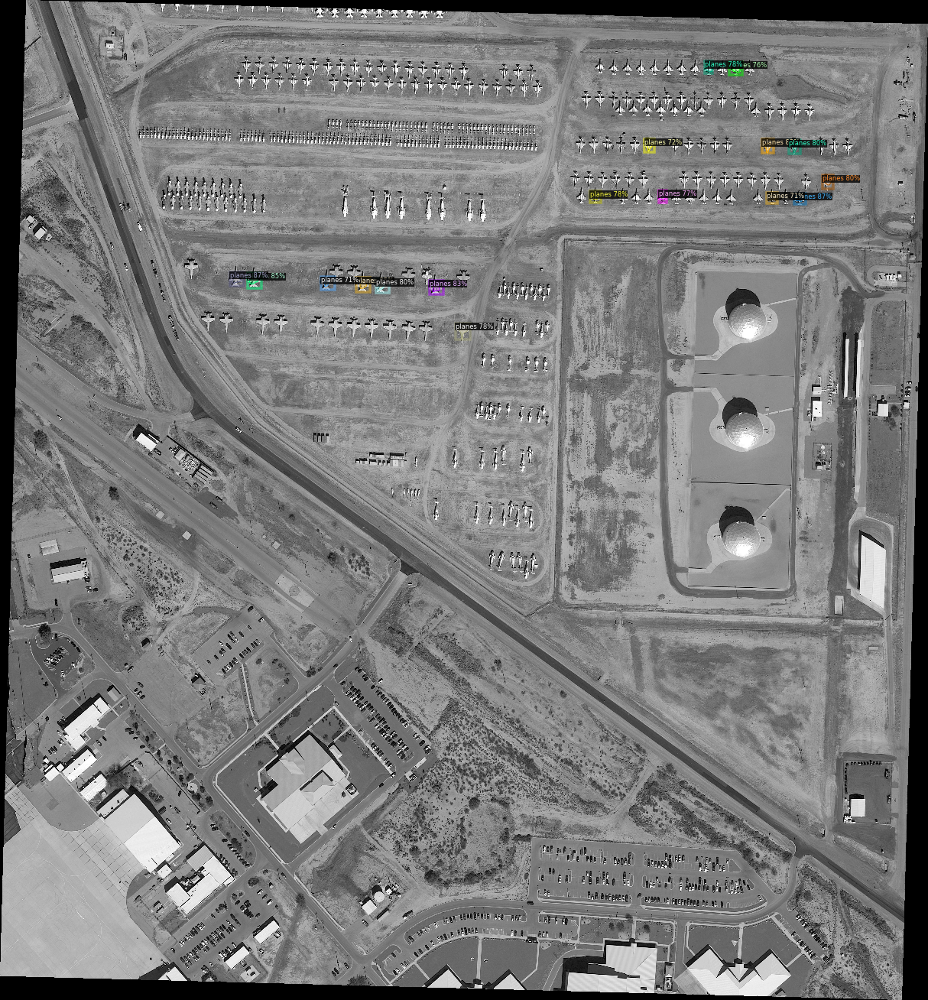

In [ ]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_detection_data("validation.json")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=planes_metadata, 
                   scale=0.2, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])


In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("plane_validation", cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "plane_validation")
print(inference_on_dataset(trainer.model, val_loader, evaluator))


[11/01 07:54:41 d2.evaluation.coco_evaluation]: 'plane_validation' is not registered by `register_coco_instances`. Therefore trying to convert it to COCO format ...
[11/01 07:54:41 d2.data.datasets.coco]: Converting annotations of dataset 'plane_validation' to COCO format ...)
[11/01 07:54:41 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[11/01 07:54:41 d2.data.datasets.coco]: Conversion finished, #images: 10, #annotations: 431
[11/01 07:54:41 d2.data.datasets.coco]: Caching COCO format annotations at '/content/drive/My Drive/CMPT_CV_lab3/output/plane_validation_coco_format.json' ...
[11/01 07:54:41 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   planes   | 431          |
|            |              |
[11/01 07:54:41 d2.data.common]: Serializing 10 elements to byte tensors and concatenating them all ...
[11/01 07:54:42 d2.data.common]: Serialized dataset takes 2.44 MiB
[11/01 07:54:42 